In [2]:
from __future__ import division
import os
import string
import cufflinks as cf
import pandas as pd
import numpy as np
import plotly.plotly as py
import plotly.tools as tls
import plotly.graph_objs as go
import plotly.offline as offline
import seaborn as sns
from plotly import tools
from plotly.tools import FigureFactory as FF
from scipy import stats, integrate
from scipy.stats import t
import matplotlib as mpl
import matplotlib.pyplot as plt


%matplotlib inline
sns.set(rc={'figure.figsize':(100,70)},font='sans-serif', font_scale=7,color_codes=True)
np.random.seed(sum(map(ord,"distributions")))

import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
cf.set_config_file(offline=True,world_readable=True,theme='ggplot')
df = pd.read_csv('/Users/nickpourazima/GitHub/he-sm/Completed Tests/Combo/Combo_Final.csv')
users = ['394','390','399','486','591','510','729','932','521','514','379','824','506','552','367','410']
testList = ['A1a1','A1a2','A1a3','A1a4','A1b1','A1b2','A1b3','A1b4','A2a1','A2a2','A2a3','A2a4','A2b1','A2b2','A2b3','A2b4',
       'A3a1','A3a2','A3a3','A3a4','A3b1','A3b2','A3b3','A3b4','A4a1','A4a2','A4a3','A4a4','A4b1','A4b2','A4b3','A4b4',
       'H1a1','H1a2','H1a3','H1a4','H1b1','H1b2','H1b3','H1b4','H2a1','H2a2','H2a3','H2a4','H2b1','H2b2','H2b3','H2b4']
#            'P1H1a1','P2H1a2','P3H1b1','P4H1b2','P5H1b3','P6A1a2','P7A1b1','P8A2a1']
hapticTests=['H1a1','H1a2','H1a3','H1a4','H1b1','H1b2','H1b3','H1b4','H2a1','H2a2','H2a3','H2a4','H2b1','H2b2','H2b3','H2b4']
audibleTests=['A1a1','A1a2','A1a3','A1a4','A1b1','A1b2','A1b3','A1b4','A2a1','A2a2','A2a3','A2a4','A2b1','A2b2','A2b3','A2b4',
       'A3a1','A3a2','A3a3','A3a4','A3b1','A3b2','A3b3','A3b4','A4a1','A4a2','A4a3','A4a4','A4b1','A4b2','A4b3','A4b4']
df = df[df.Test.isin(testList)]
df = df[df["User ID"].isin(users)]
# df.IOI = pd.to_timedelta((df.IOI),unit='ms')/np.timedelta64(1, 'ms')
# df.to_csv("Combo2.csv")

/usr/local/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning:

The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.



In [30]:
labels = df["Group"]
values = df["User ID"]

trace = go.Pie(labels=labels, values=values)

py.iplot([trace], filename='basic_pie_chart')

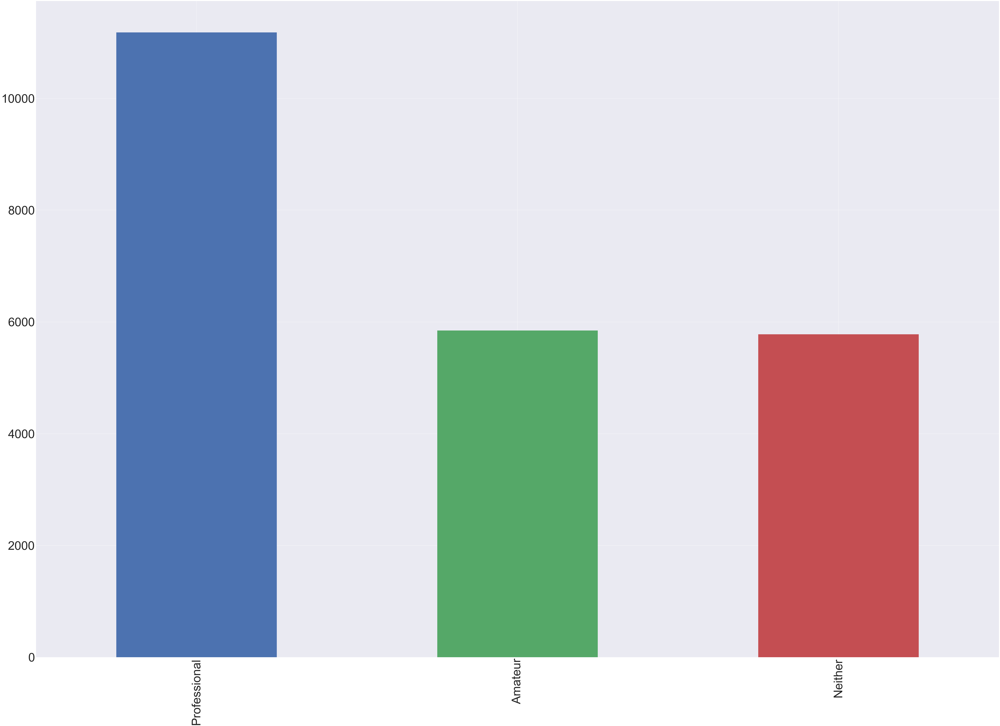

In [34]:
pd.value_counts(df['Group']).plot.bar()

In [19]:
def kde_plot(df, conditions, dv, col_name, save_file=False):
    sns.set_style('white')
    sns.set_style('ticks')
    fig, ax = plt.subplots()
 
    for condition in conditions:
        condition_data = df[(df[col_name] == condition)][dv]
        sns.kdeplot(condition_data, shade=True, label=condition)
        
    sns.despine()
    
    if save_file:
        plt.savefig("kernel_density_estimate_seaborn_python_response"
                     "-time.png")
    plt.show()
    
def cdf(df, conditions=['A1a1', 'H1a1']):
 
    data = {i: df[(df.Test == conditions[i])] for i in range(len(
        conditions))}
    plot_data = []
 
    for i, condition in enumerate(conditions):
 
        rt = data[i]["Sanitized Asynchrony"].sort_values()
        yvals = np.arange(len(rt)) / float(len(rt))
 
        # Append it to the data
        cond = [condition]*len(yvals)
 
        df = pd.DataFrame(dict(dens=yvals, dv=rt, condition=cond))
        plot_data.append(df)
 
    plot_data = pd.concat(plot_data, axis=0)
 
    return plot_data

def cdf_plot(cdf_data, save_file=False, legend=True):
    sns.set_style('white')
    sns.set_style('ticks')
    sns.set(rc={'figure.figsize':(100,60)},font='sans-serif', font_scale=1,color_codes=True)
    g = sns.FacetGrid(cdf_data, size=10, hue="condition")
    g.map(plt.plot, "dv", "dens", alpha=.7, linewidth=1)
    if legend:
        g.add_legend(title="Congruency")
    g.set_axis_labels("Response Time (ms.)", "Probability")
    g.fig.suptitle('Cumulative Distribution Function')
 
    if save_file:
        g.savefig("cumulative_distribution_function_seaborn_python_response"
                  "-time.png")
 
    plt.show()
    
def calc_delta_data(df, subid, dv, condition, conditions=['A1a1',
                                                   'H1a1']):
  
    subjects = pd.Series(df[subid].values.ravel()).unique().tolist()
    subjects.sort()
 
    deciles = np.arange(0.1, 1., 0.1)
 
    cond_one = conditions[0]
    cond_two = conditions[1]
 
    # Frame to store the data (per subject)
    arrays = [np.array([cond_one, cond_two]).repeat(len(deciles)),
              np.array(deciles).tolist() * 2]
    data_delta = pd.DataFrame(columns=subjects, index=arrays)
 
    for subject in subjects:
 
        sub_data_inc = df.loc[(df[subid] == subject) & (df[condition] ==
                                                        cond_one)]
        sub_data_con = df.loc[(df[subid] == subject) & (df[condition] ==
                                                        cond_two)]
 
        inc_q = sub_data_inc[dv].quantile(q=deciles).values
        con_q = sub_data_con[dv].quantile(q=deciles).values
        for i, dec in enumerate(deciles):
            data_delta.loc[(cond_one, dec)][subject] = inc_q[i]
            data_delta.loc[(cond_two, dec)][subject] = con_q[i]
 
 
    # Aggregate deciles
    data_delta = data_delta.mean(axis=1).unstack(level=0)
    # Calculate difference
    data_delta['Diff'] = data_delta[cond_one] - data_delta[cond_two]
    # Calculate average
    data_delta['Average'] = (data_delta[cond_one] + data_delta[cond_two]) / 2
 
    return data_delta

def delta_plot(delta_data, save_file=False):
 
    ymax = delta_data['Diff'].max() + 10
    ymin = -10
    xmin = delta_data['Average'].min() - 20
    xmax = delta_data['Average'].max() + 20
 
    sns.set_style('white')
    g = sns.FacetGrid(delta_data, ylim=(ymin, ymax), xlim=(xmin, xmax), size=8)
    g.map(plt.scatter, "Average", "Diff", s=50, alpha=.7, linewidth=1,
          edgecolor="white")
    g.map(plt.plot, "Average", "Diff", alpha=.7, linewidth=1)
    g.set_axis_labels("Avarage RTs (ms.)", "Effect (ms.)")
    g.fig.suptitle('Delta Plot')
    if save_file:
        g.savefig("delta_plot_seaborn_python_response-time.png")
 
    plt.show()

In [20]:
i=0;
j=0;
for item in pd.loc[pd['User ID']]:
    if(item == users[i]):
        for test in pd['Test']:
            if(test == testList[j]):
                pd['Corrected Mean'] = pd['Sanitized Asynchrony'].mean(skipna=False)
            else:
                j=j+1
    else:
        i=i+1

IndexError: list index out of range

In [18]:
filter1DF = pd.loc[(pd['User ID']==591)]
i=0;
j=0;
for x in filter1DF['Test']:
    if (x == testList[i]):
        filter1DF['Phase Correction Response'] = filter1DF['Sanitized Asynchrony'].shift(-1)-filter1DF['Sanitized Asynchrony']
    else:
        i=i+1
# print(filter1DF['Phase Correction Response'])
# filter1DF['Phase Correction Response'] = filter1DF['Test'].apply(lambda x: filter1DF['Sanitized Asynchrony'].shift(-1)-filter1DF['Sanitized Asynchrony'] if x == 'A1a1' else np.NaN)
filter1DF.to_csv("591 Mod.csv")

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [68]:
newList = ['H2b1','H2b2','H2b3','H2b4']
# df.IOI.describe()
newdf = df[df.Test.isin(newList)]
newdf.IOI[newdf.Test==newList[0]] = newdf.IOI.mean()
newdf.IOI[newdf.Test==newList[1]] = newdf.IOI.mean()
newdf.IOI[newdf.Test==newList[2]] = newdf.IOI.mean()
newdf.IOI[newdf.Test==newList[3]] = newdf.IOI.mean()
sns.barplot(y="Sanitized Asynchrony",x="IOI",data=newdf,hue="Test")
plt.xticks(rotation=45)

TypeError: Could not convert 0 days 00:00:00.3357760000 days 00:00:00.3198240000 days 00:00:00.3356770000 days 00:00:00.3358780000 days 00:00:00.3357780000 days 00:00:00.3360480000 days 00:00:00.3196110000 days 00:00:00.3358520000 days 00:00:00.3358430000 days 00:00:00.3359150000 days 00:00:00.3357130000 days 00:00:00.3357410000 days 00:00:00.3203160000 days 00:00:00.3357080000 days 00:00:00.3359560000 days 00:00:00.3356510000 days 00:00:00.3357960000 days 00:00:00.3199870000 days 00:00:00.3356970000 days 00:00:00.3359270000 days 00:00:00.3357090000 days 00:00:00.3357690000 days 00:00:00.3200380000 days 00:00:00.3356570000 days 00:00:00.3357690000 days 00:00:00.3359840000 days 00:00:00.3357610000 days 00:00:00.3197350000 days 00:00:00.3360350000 days 00:00:00.3357330000 days 00:00:00.3359390000 days 00:00:00.3356800000 days 00:00:00.3359430000 days 00:00:00.3198040000 days 00:00:00.3359160000 days 00:00:00.3356080000 days 00:00:00.3359200000 days 00:00:00.3357400000 days 00:00:00.3198940000 days 00:00:00.3358760000 days 00:00:00.3356550000 days 00:00:00.3358790000 days 00:00:00.3358990000 days 00:00:00.3198850000 days 00:00:00.3357560000 days 00:00:00.3353740000 days 00:00:00.3360110000 days 00:00:00.3199630000 days 00:00:00.3358730000 days 00:00:00.3358940000 days 00:00:00.3356740000 days 00:00:00.3359790000 days 00:00:00.3355530000 days 00:00:00.3201050000 days 00:00:00.3358080000 days 00:00:00.3359160000 days 00:00:00.3355060000 days 00:00:00.3359970000 days 00:00:00.3199050000 days 00:00:00.3356660000 days 00:00:00.3357010000 days 00:00:00.3359540000 days 00:00:00.3356060000 days 00:00:00.3199830000 days 00:00:00.3358570000 days 00:00:00.3359160000 days 00:00:00.3358900000 days 00:00:00.3358370000 days 00:00:00.3197540000 days 00:00:00.3358630000 days 00:00:00.3358880000 days 00:00:00.3358720000 days 00:00:00.3356330000 days 00:00:00.3359500000 days 00:00:00.3195980000 days 00:00:00.3359680000 days 00:00:00.3356470000 days 00:00:00.3360630000 days 00:00:00.3354750000 days 00:00:00.3200300000 days 00:00:00.3358670000 days 00:00:00.3359440000 days 00:00:00.3357780000 days 00:00:00.3357170000 days 00:00:00.3197930000 days 00:00:00.3359520000 days 00:00:00.3358520000 days 00:00:00.3358240000 days 00:00:00.3355920000 days 00:00:00.3359420000 days 00:00:00.3354400000 days 00:00:00.3358830000 days 00:00:00.3361800000 days 00:00:00.3358150000 days 00:00:00.3196760000 days 00:00:00.3357900000 days 00:00:00.3358430000 days 00:00:00.3359130000 days 00:00:00.3358900000 days 00:00:00.3198020000 days 00:00:00.3358690000 days 00:00:00.3356840000 days 00:00:00.3359020000 days 00:00:00.3358590000 days 00:00:00.3198430000 days 00:00:00.3358400000 days 00:00:00.3359830000 days 00:00:00.3356280000 days 00:00:00.3357500000 days 00:00:00.3358030000 days 00:00:00.3199230000 days 00:00:00.3358010000 days 00:00:00.3357090000 days 00:00:00.3365130000 days 00:00:00.3352870000 days 00:00:00.3197920000 days 00:00:00.3356920000 days 00:00:00.3359130000 days 00:00:00.3359050000 days 00:00:00.3357900000 days 00:00:00.3357480000 days 00:00:00.3199630000 days 00:00:00.3356770000 days 00:00:00.3357930000 days 00:00:00.3358550000 days 00:00:00.3359550000 days 00:00:00.3198270000 days 00:00:00.3357100000 days 00:00:00.3359550000 days 00:00:00.3356830000 days 00:00:00.3358300000 days 00:00:00.3199600000 days 00:00:00.3356740000 days 00:00:00.3358780000 days 00:00:00.3357450000 days 00:00:00.3357610000 days 00:00:00.3360140000 days 00:00:00.3198750000 days 00:00:00.3354070000 days 00:00:00.3360420000 days 00:00:00.3365390000 days 00:00:00.3351460000 days 00:00:00.3357930000 days 00:00:00.3198140000 days 00:00:00.3361280000 days 00:00:00.3357140000 days 00:00:00.3358080000 days 00:00:00.3358320000 days 00:00:00.3198300000 days 00:00:00.3358370000 days 00:00:00.3355440000 days 00:00:00.3362180000 days 00:00:00.3355760000 days 00:00:00.3199540000 days 00:00:00.3356820000 days 00:00:00.3358280000 days 00:00:00.3358680000 days 00:00:00.3357110000 days 00:00:00.3198850000 days 00:00:00.3359310000 days 00:00:00.3358740000 days 00:00:00.3357570000 days 00:00:00.3358490000 days 00:00:00.3357980000 days 00:00:00.3197310000 days 00:00:00.3358910000 days 00:00:00.3361310000 days 00:00:00.3354330000 days 00:00:00.3360220000 days 00:00:00.3193800000 days 00:00:00.3360790000 days 00:00:00.3357800000 days 00:00:00.3360080000 days 00:00:00.3356660000 days 00:00:00.3358120000 days 00:00:00.3199680000 days 00:00:00.3357930000 days 00:00:00.3357520000 days 00:00:00.3358110000 days 00:00:00.3358790000 days 00:00:00.3355720000 days 00:00:00.3200400000 days 00:00:00.3357340000 days 00:00:00.3358880000 days 00:00:00.3356960000 days 00:00:00.3358790000 days 00:00:00.3358020000 days 00:00:00.3198410000 days 00:00:00.3359130000 days 00:00:00.3356740000 days 00:00:00.3357510000 days 00:00:00.3357110000 days 00:00:00.3200450000 days 00:00:00.3359270000 days 00:00:00.3358100000 days 00:00:00.3357080000 days 00:00:00.3359720000 days 00:00:00.3198260000 days 00:00:00.3358340000 days 00:00:00.3357860000 days 00:00:00.3358710000 days 00:00:00.3358560000 days 00:00:00.3355600000 days 00:00:00.3200740000 days 00:00:00.3357510000 days 00:00:00.3358680000 days 00:00:00.3356210000 days 00:00:00.3358880000 days 00:00:00.3199420000 days 00:00:00.3356490000 days 00:00:00.3358680000 days 00:00:00.3358910000 days 00:00:00.3357410000 days 00:00:00.3199520000 days 00:00:00.3356740000 days 00:00:00.3358240000 days 00:00:00.3360140000 days 00:00:00.3358970000 days 00:00:00.3356760000 days 00:00:00.3198910000 days 00:00:00.3359580000 days 00:00:00.3357160000 days 00:00:00.3354220000 days 00:00:00.3358870000 days 00:00:00.3201110000 days 00:00:00.3195270000 days 00:00:00.3359980000 days 00:00:00.3357440000 days 00:00:00.3357760000 days 00:00:00.3357590000 days 00:00:00.3200060000 days 00:00:00.3357460000 days 00:00:00.3358740000 days 00:00:00.3358230000 days 00:00:00.3377140000 days 00:00:00.3338910000 days 00:00:00.3195000000 days 00:00:00.3361990000 days 00:00:00.3358040000 days 00:00:00.3357360000 days 00:00:00.3358800000 days 00:00:00.3196810000 days 00:00:00.3358130000 days 00:00:00.3358890000 days 00:00:00.3359020000 days 00:00:00.3356550000 days 00:00:00.3358880000 days 00:00:00.3199780000 days 00:00:00.3355990000 days 00:00:00.3359630000 days 00:00:00.3358760000 days 00:00:00.3358380000 days 00:00:00.3196750000 days 00:00:00.3359960000 days 00:00:00.3356740000 days 00:00:00.3359310000 days 00:00:00.3358500000 days 00:00:00.3196650000 days 00:00:00.3358160000 days 00:00:00.3360440000 days 00:00:00.3356350000 days 00:00:00.3359420000 days 00:00:00.3357640000 days 00:00:00.3198730000 days 00:00:00.3358750000 days 00:00:00.3358420000 days 00:00:00.3356050000 days 00:00:00.3359840000 days 00:00:00.3197090000 days 00:00:00.3359520000 days 00:00:00.3358220000 days 00:00:00.3357840000 days 00:00:00.3359460000 days 00:00:00.3359050000 days 00:00:00.3195470000 days 00:00:00.3359000000 days 00:00:00.3359520000 days 00:00:00.3355890000 days 00:00:00.3359530000 days 00:00:00.3199370000 days 00:00:00.3357520000 days 00:00:00.3357500000 days 00:00:00.3358870000 days 00:00:00.3357730000 days 00:00:00.3196690000 days 00:00:00.3359130000 days 00:00:00.3359880000 days 00:00:00.3357860000 days 00:00:00.3359350000 days 00:00:00.3353010000 days 00:00:00.3204250000 days 00:00:00.3356790000 days 00:00:00.3358070000 days 00:00:00.3358490000 days 00:00:00.3358380000 days 00:00:00.3196530000 days 00:00:00.3359610000 days 00:00:00.3357000000 days 00:00:00.3359050000 days 00:00:00.3358320000 days 00:00:00.3199010000 days 00:00:00.3356330000 days 00:00:00.3357820000 days 00:00:00.3358990000 days 00:00:00.3358430000 days 00:00:00.3359510000 days 00:00:00.3198300000 days 00:00:00.3356830000 days 00:00:00.3357750000 days 00:00:00.3358420000 days 00:00:00.3356330000 days 00:00:00.3200560000 days 00:00:00.3360090000 days 00:00:00.3355810000 days 00:00:00.3359520000 days 00:00:00.3200090000 days 00:00:00.3357600000 days 00:00:00.3359200000 days 00:00:00.3358050000 days 00:00:00.3358590000 days 00:00:00.3356020000 days 00:00:00.3200010000 days 00:00:00.3358180000 days 00:00:00.3358230000 days 00:00:00.3357090000 days 00:00:00.3357940000 days 00:00:00.3198130000 days 00:00:00.3358990000 days 00:00:00.3358920000 days 00:00:00.3358950000 days 00:00:00.3354540000 days 00:00:00.3200890000 days 00:00:00.3357690000 days 00:00:00.3361090000 days 00:00:00.3355920000 days 00:00:00.3359260000 days 00:00:00.3357990000 days 00:00:00.3198540000 days 00:00:00.3358120000 days 00:00:00.3356210000 days 00:00:00.3357500000 days 00:00:00.3359970000 days 00:00:00.3200470000 days 00:00:00.3356260000 days 00:00:00.3357670000 days 00:00:00.3358090000 days 00:00:00.3358850000 days 00:00:00.3199470000 days 00:00:00.3357520000 days 00:00:00.3357820000 days 00:00:00.3359650000 days 00:00:00.3354220000 days 00:00:00.3358800000 days 00:00:00.3201940000 days 00:00:00.3358270000 days 00:00:00.3358420000 days 00:00:00.3358840000 days 00:00:00.3356580000 days 00:00:00.3197480000 days 00:00:00.3358300000 days 00:00:00.3198500000 days 00:00:00.3356460000 days 00:00:00.3358330000 days 00:00:00.3359470000 days 00:00:00.3357660000 days 00:00:00.3200290000 days 00:00:00.3356090000 days 00:00:00.3359560000 days 00:00:00.3358080000 days 00:00:00.3356770000 days 00:00:00.3197110000 days 00:00:00.3362390000 days 00:00:00.3358520000 days 00:00:00.3358280000 days 00:00:00.3358050000 days 00:00:00.3197010000 days 00:00:00.3358720000 days 00:00:00.3359420000 days 00:00:00.3358230000 days 00:00:00.3356170000 days 00:00:00.3360470000 days 00:00:00.3197920000 days 00:00:00.3359320000 days 00:00:00.3356420000 days 00:00:00.3359280000 days 00:00:00.3357050000 days 00:00:00.3199220000 days 00:00:00.3356280000 days 00:00:00.3359590000 days 00:00:00.3356000000 days 00:00:00.3358200000 days 00:00:00.3199130000 days 00:00:00.3358160000 days 00:00:00.3361640000 days 00:00:00.3357500000 days 00:00:00.3358180000 days 00:00:00.3359320000 days 00:00:00.3196960000 days 00:00:00.3359570000 days 00:00:00.3356900000 days 00:00:00.3359360000 days 00:00:00.3357770000 days 00:00:00.3199800000 days 00:00:00.3355970000 days 00:00:00.3357740000 days 00:00:00.3356440000 days 00:00:00.3358350000 days 00:00:00.3359620000 days 00:00:00.3354720000 days 00:00:00.3199700000 days 00:00:00.3358440000 days 00:00:00.3359560000 days 00:00:00.3359160000 days 00:00:00.3357920000 days 00:00:00.3197180000 days 00:00:00.3356490000 days 00:00:00.3360310000 days 00:00:00.3360100000 days 00:00:00.3356820000 days 00:00:00.3199300000 days 00:00:00.3359080000 days 00:00:00.3356650000 days 00:00:00.3359740000 days 00:00:00.3356940000 days 00:00:00.3199730000 days 00:00:00.3356920000 days 00:00:00.3359170000 days 00:00:00.3357040000 days 00:00:00.3359560000 days 00:00:00.3358580000 days 00:00:00.3197440000 days 00:00:00.3357640000 days 00:00:00.3360380000 days 00:00:00.3358370000 days 00:00:00.3358710000 days 00:00:00.3196500000 days 00:00:00.3357660000 days 00:00:00.3357300000 days 00:00:00.3359840000 days 00:00:00.3358200000 days 00:00:00.3359310000 days 00:00:00.3197560000 days 00:00:00.3359820000 days 00:00:00.3358000000 days 00:00:00.3357060000 days 00:00:00.3357950000 days 00:00:00.3199280000 days 00:00:00.3359130000 days 00:00:00.3357340000 days 00:00:00.3357720000 days 00:00:00.3197800000 days 00:00:00.3357810000 days 00:00:00.3363230000 days 00:00:00.3349810000 days 00:00:00.3362980000 days 00:00:00.3393410000 days 00:00:00.3159100000 days 00:00:00.3360410000 days 00:00:00.3358600000 days 00:00:00.3359360000 days 00:00:00.3357460000 days 00:00:00.3199510000 days 00:00:00.3356990000 days 00:00:00.3358670000 days 00:00:00.3359810000 days 00:00:00.3358230000 days 00:00:00.3196880000 days 00:00:00.3359730000 days 00:00:00.3357550000 days 00:00:00.3358410000 days 00:00:00.3357170000 days 00:00:00.3358140000 days 00:00:00.3197540000 days 00:00:00.3361130000 days 00:00:00.3354450000 days 00:00:00.3360780000 days 00:00:00.3357570000 days 00:00:00.3198560000 days 00:00:00.3357040000 days 00:00:00.3358210000 days 00:00:00.3359050000 days 00:00:00.3359440000 days 00:00:00.3197660000 days 00:00:00.3359380000 days 00:00:00.3355840000 days 00:00:00.3360070000 days 00:00:00.3358940000 days 00:00:00.3355260000 days 00:00:00.3201240000 days 00:00:00.3358310000 days 00:00:00.3356030000 days 00:00:00.3360750000 days 00:00:00.3357160000 days 00:00:00.3199880000 days 00:00:00.3358040000 days 00:00:00.3358830000 days 00:00:00.3356290000 days 00:00:00.3359390000 days 00:00:00.3354060000 days 00:00:00.3201700000 days 00:00:00.3358350000 days 00:00:00.3357190000 days 00:00:00.3358820000 days 00:00:00.3360240000 days 00:00:00.3197400000 days 00:00:00.3358430000 days 00:00:00.3355450000 days 00:00:00.3362100000 days 00:00:00.3355360000 days 00:00:00.3360770000 days 00:00:00.3198950000 days 00:00:00.3357640000 days 00:00:00.3358180000 days 00:00:00.3359520000 days 00:00:00.3357270000 days 00:00:00.3199810000 days 00:00:00.3358010000 days 00:00:00.3357140000 days 00:00:00.3359420000 days 00:00:00.3356970000 days 00:00:00.3200200000 days 00:00:00.3356450000 days 00:00:00.3359240000 days 00:00:00.3356050000 days 00:00:00.3359850000 days 00:00:00.3360330000 days 00:00:00.3196210000 days 00:00:00.3357920000 days 00:00:00.3358990000 days 00:00:00.3356780000 days 00:00:00.3358050000 days 00:00:00.3201580000 days 00:00:00.3357510000 days 00:00:00.3358450000 days 00:00:00.3357340000 days 00:00:00.3356960000 days 00:00:00.3201150000 days 00:00:00.3358590000 days 00:00:00.3356710000 days 00:00:00.3359910000 days 00:00:00.3359660000 days 00:00:00.3358080000 days 00:00:00.3198710000 days 00:00:00.3356090000 days 00:00:00.3358700000 days 00:00:00.3358750000 days 00:00:00.3357460000 days 00:00:00.3200360000 days 00:00:00.3358190000 days 00:00:00.3359850000 days 00:00:00.3357290000 days 00:00:00.3356450000 days 00:00:00.3357510000 days 00:00:00.3200700000 days 00:00:00.3357240000 days 00:00:00.3358340000 days 00:00:00.3360220000 days 00:00:00.3357780000 days 00:00:00.3195950000 days 00:00:00.3359470000 days 00:00:00.3360210000 days 00:00:00.3356440000 days 00:00:00.3358260000 days 00:00:00.3199690000 days 00:00:00.3358310000 days 00:00:00.3357690000 days 00:00:00.3357260000 days 00:00:00.3356970000 days 00:00:00.3201580000 days 00:00:00.3358100000 days 00:00:00.3358720000 days 00:00:00.3358200000 days 00:00:00.3358090000 days 00:00:00.3356660000 days 00:00:00.3198230000 days 00:00:00.3359570000 days 00:00:00.3358310000 days 00:00:00.3357340000 days 00:00:00.3359130000 days 00:00:00.3197420000 days 00:00:00.3359400000 days 00:00:00.3358730000 days 00:00:00.3357940000 days 00:00:00.3356820000 days 00:00:00.3200650000 days 00:00:00.3359580000 days 00:00:00.3358360000 days 00:00:00.3356520000 days 00:00:00.3199710000 days 00:00:00.3359460000 days 00:00:00.3357420000 days 00:00:00.3357160000 days 00:00:00.3360000000 days 00:00:00.3196420000 days 00:00:00.3360740000 days 00:00:00.3358990000 days 00:00:00.3356280000 days 00:00:00.3357720000 days 00:00:00.3200570000 days 00:00:00.3355720000 days 00:00:00.3361000000 days 00:00:00.3358020000 days 00:00:00.3358560000 days 00:00:00.3358160000 days 00:00:00.3197140000 days 00:00:00.3357330000 days 00:00:00.3359790000 days 00:00:00.3357510000 days 00:00:00.3356870000 days 00:00:00.3201570000 days 00:00:00.3355640000 days 00:00:00.3358630000 days 00:00:00.3358700000 days 00:00:00.3358300000 days 00:00:00.3357800000 days 00:00:00.3200300000 days 00:00:00.3356570000 days 00:00:00.3358390000 days 00:00:00.3358320000 days 00:00:00.3358500000 days 00:00:00.3199570000 days 00:00:00.3358900000 days 00:00:00.3357030000 days 00:00:00.3356290000 days 00:00:00.3359690000 days 00:00:00.3200270000 days 00:00:00.3356060000 days 00:00:00.3359910000 days 00:00:00.3358220000 days 00:00:00.3358840000 days 00:00:00.3358070000 days 00:00:00.3357950000 days 00:00:00.3198520000 days 00:00:00.3354000000 days 00:00:00.3359290000 days 00:00:00.3361390000 days 00:00:00.3358160000 days 00:00:00.3198080000 days 00:00:00.3357010000 days 00:00:00.3377750000 days 00:00:00.3339060000 days 00:00:00.3359450000 days 00:00:00.3357860000 days 00:00:00.3199040000 days 00:00:00.3356810000 days 00:00:00.3359680000 days 00:00:00.3357930000 days 00:00:00.3359820000 days 00:00:00.3194810000 days 00:00:00.3357150000 days 00:00:00.3361870000 days 00:00:00.3357550000 days 00:00:00.3356970000 days 00:00:00.3357950000 days 00:00:00.3198880000 days 00:00:00.3360850000 days 00:00:00.3358290000 days 00:00:00.3356390000 days 00:00:00.3358990000 days 00:00:00.3197980000 days 00:00:00.3357100000 days 00:00:00.3361360000 days 00:00:00.3358810000 days 00:00:00.3355860000 days 00:00:00.3200780000 days 00:00:00.3355990000 days 00:00:00.3358360000 days 00:00:00.3359750000 days 00:00:00.3357860000 days 00:00:00.3357840000 days 00:00:00.3199180000 days 00:00:00.3357290000 days 00:00:00.3359400000 days 00:00:00.3356820000 days 00:00:00.3360070000 days 00:00:00.3358180000 days 00:00:00.3199190000 days 00:00:00.3357800000 days 00:00:00.3357750000 days 00:00:00.3360160000 days 00:00:00.3356640000 days 00:00:00.3199330000 days 00:00:00.3358550000 days 00:00:00.3357240000 days 00:00:00.3357040000 days 00:00:00.3359650000 days 00:00:00.3358070000 days 00:00:00.3199760000 days 00:00:00.3358190000 days 00:00:00.3357210000 days 00:00:00.3358000000 days 00:00:00.3360310000 days 00:00:00.3195120000 days 00:00:00.3360300000 days 00:00:00.3361390000 days 00:00:00.3355620000 days 00:00:00.3355700000 days 00:00:00.3358970000 days 00:00:00.3199270000 days 00:00:00.3359750000 days 00:00:00.3357410000 days 00:00:00.3357830000 days 00:00:00.3359150000 days 00:00:00.3199480000 days 00:00:00.3356650000 days 00:00:00.3357990000 days 00:00:00.3359710000 days 00:00:00.3357810000 days 00:00:00.3197550000 days 00:00:00.3358300000 days 00:00:00.3360420000 days 00:00:00.3358100000 days 00:00:00.3354850000 days 00:00:00.3199690000 days 00:00:00.3356140000 days 00:00:00.3361620000 days 00:00:00.3358850000 days 00:00:00.3358340000 days 00:00:00.3357400000 days 00:00:00.3197840000 days 00:00:00.3355930000 days 00:00:00.3362760000 days 00:00:00.3356440000 days 00:00:00.3360300000 days 00:00:00.3197890000 days 00:00:00.3356840000 days 00:00:00.3358280000 days 00:00:00.3359430000 days 00:00:00.3356740000 days 00:00:00.3199330000 days 00:00:00.3358640000 days 00:00:00.3356840000 days 00:00:00.3358740000 days 00:00:00.3358840000 days 00:00:00.3358510000 days 00:00:00.3196300000 days 00:00:00.3359090000 days 00:00:00.3358680000 days 00:00:00.3356420000 days 00:00:00.3360040000 days 00:00:00.3199660000 days 00:00:00.3357500000 days 00:00:00.3359430000 days 00:00:00.3358270000 days 00:00:00.3357040000 days 00:00:00.3198920000 days 00:00:00.3359110000 days 00:00:00.3358630000 days 00:00:00.3357910000 days 00:00:00.3357570000 days 00:00:00.3355280000 days 00:00:00.3201240000 days 00:00:00.3358610000 days 00:00:00.3358940000 days 00:00:00.3357480000 days 00:00:00.3357920000 days 00:00:00.3196900000 days 00:00:00.3361200000 days 00:00:00.3357570000 days 00:00:00.3357200000 days 00:00:00.3357630000 days 00:00:00.3200350000 days 00:00:00.3357580000 days 00:00:00.3358130000 days 00:00:00.3358280000 days 00:00:00.3358370000 days 00:00:00.3198460000 days 00:00:00.3359720000 days 00:00:00.3356540000 days 00:00:00.3359660000 days 00:00:00.3357740000 days 00:00:00.3359540000 days 00:00:00.3194130000 days 00:00:00.3361930000 days 00:00:00.3356990000 days 00:00:00.3358390000 days 00:00:00.3359530000 days 00:00:00.3198420000 days 00:00:00.3358420000 days 00:00:00.3358290000 days 00:00:00.3356870000 days 00:00:00.3359570000 days 00:00:00.3197230000 days 00:00:00.3357610000 days 00:00:00.3359650000 days 00:00:00.3358100000 days 00:00:00.3357480000 days 00:00:00.3356750000 days 00:00:00.3199710000 days 00:00:00.3359440000 days 00:00:00.3356280000 days 00:00:00.3362320000 days 00:00:00.3355230000 days 00:00:00.3201110000 days 00:00:00.3355780000 days 00:00:00.3358510000 days 00:00:00.3357710000 days 00:00:00.3358670000 days 00:00:00.3197050000 days 00:00:00.3360320000 days 00:00:00.3357130000 days 00:00:00.3357110000 days 00:00:00.3361890000 days 00:00:00.3198070000 days 00:00:00.3356780000 days 00:00:00.3359770000 days 00:00:00.3358470000 days 00:00:00.3357670000 days 00:00:00.3358610000 days 00:00:00.3197190000 days 00:00:00.3356450000 days 00:00:00.3199630000 days 00:00:00.3357180000 days 00:00:00.3358170000 days 00:00:00.3359860000 days 00:00:00.3357050000 days 00:00:00.3199470000 days 00:00:00.3359060000 days 00:00:00.3356220000 days 00:00:00.3359790000 days 00:00:00.3358190000 days 00:00:00.3199870000 days 00:00:00.3355840000 days 00:00:00.3358320000 days 00:00:00.3358000000 days 00:00:00.3360240000 days 00:00:00.3357870000 days 00:00:00.3198500000 days 00:00:00.3357520000 days 00:00:00.3359190000 days 00:00:00.3358110000 days 00:00:00.3359050000 days 00:00:00.3197650000 days 00:00:00.3355870000 days 00:00:00.3359690000 days 00:00:00.3359870000 days 00:00:00.3356470000 days 00:00:00.3367330000 days 00:00:00.3189670000 days 00:00:00.3359320000 days 00:00:00.3356060000 days 00:00:00.3360970000 days 00:00:00.3357440000 days 00:00:00.3195450000 days 00:00:00.3360420000 days 00:00:00.3357740000 days 00:00:00.3357480000 days 00:00:00.3358980000 days 00:00:00.3197280000 days 00:00:00.3359880000 days 00:00:00.3358300000 days 00:00:00.3358660000 days 00:00:00.3356060000 days 00:00:00.3360650000 days 00:00:00.3195650000 days 00:00:00.3357870000 days 00:00:00.3360290000 days 00:00:00.3358510000 days 00:00:00.3358780000 days 00:00:00.3197990000 days 00:00:00.3357200000 days 00:00:00.3358240000 days 00:00:00.3359410000 days 00:00:00.3357950000 days 00:00:00.3197460000 days 00:00:00.3357040000 days 00:00:00.3360010000 days 00:00:00.3358090000 days 00:00:00.3357090000 days 00:00:00.3197800000 days 00:00:00.3361130000 days 00:00:00.3359020000 days 00:00:00.3356050000 days 00:00:00.3358700000 days 00:00:00.3359350000 days 00:00:00.3197100000 days 00:00:00.3357250000 days 00:00:00.3364400000 days 00:00:00.3353680000 days 00:00:00.3359180000 days 00:00:00.3197100000 days 00:00:00.3357040000 days 00:00:00.3361120000 days 00:00:00.3356790000 days 00:00:00.3357820000 days 00:00:00.3200430000 days 00:00:00.3357450000 days 00:00:00.3355540000 days 00:00:00.3360990000 days 00:00:00.3358490000 days 00:00:00.3358440000 days 00:00:00.3196020000 days 00:00:00.3359620000 days 00:00:00.3357710000 days 00:00:00.3359090000 days 00:00:00.3360010000 days 00:00:00.3195530000 days 00:00:00.3359160000 days 00:00:00.3358830000 days 00:00:00.335787000319.909336.054335.528335.975335.69335.833320.097335.871335.784336.071335.673319.874335.747336.123335.738335.863320.066335.69335.804335.818335.739320.007335.926335.695335.847335.95335.846320.126335.471336.026335.8335.942319.693336.076335.706336.035335.788319.731336.06335.629336.007336.106335.702319.982335.578319.896335.863335.763335.829335.838335.95319.764335.944335.824335.798335.958319.635335.853335.924335.694335.895319.908335.836335.718335.818335.945335.599320.069335.65335.983335.844335.741319.717335.912335.813336.009335.789319.757335.964335.791335.738335.91335.909319.8335.749335.807335.892335.717319.853336.012335.691336.036335.714335.864319.915336.061335.803335.707335.805320.077335.932335.661335.764335.818335.959319.95335.704336.008335.778335.701320.192335.59336.005335.759335.998319.718336.116335.701335.979335.629336.102319.925335.743335.836335.768335.997320.004335.723335.887335.726336.174319.922335.605335.746335.868335.885335.612319.747335.953335.839335.871335.497336.153319.85335.849335.678335.801335.976319.81335.87335.528335.805335.902319.729336.118335.672335.871335.812335.676319.86336.048335.889335.44336.054319.794336.028335.738335.778335.839319.744335.9336.163335.567335.74319.919335.732335.804335.769335.868336.07336.147319.856335.681335.958335.871335.782335.804320.025335.837335.751335.824335.809320.123335.609336.194335.486335.967320.153335.91335.808335.592336.048319.829335.76336.021335.824335.77335.947319.582336.23335.713335.667335.893320.008336.056335.543335.848335.762320.174335.688336.177335.736335.684336.048319.813319.992335.927335.586335.901335.757320.021335.996335.584335.872336.146319.525336.01336.153335.452336.104335.782320.024335.735335.946335.852335.918319.725335.754335.981336.013335.572319.931335.769335.827335.999335.876336.018319.847335.951335.596335.664335.988319.961335.895335.673335.945335.941319.842335.743335.972319.607336.045335.722336.07335.649319.878336.024335.714335.851335.879335.502320.148335.808335.735336.005335.759319.838335.498336.007335.908335.893319.677335.987335.716335.768335.824319.817335.829335.681335.977335.897335.761319.943335.818335.746335.891335.694319.863336.023335.619335.863335.661320.173335.756335.94335.887335.742335.871319.845335.856335.92335.769335.921335.684319.794335.888335.952335.643335.877319.851335.77335.842335.834335.999319.712335.854335.791335.965335.673336.044319.674335.948335.694335.91335.752319.844335.835335.979335.801335.702319.989335.727335.961335.792335.763335.788319.967335.775335.847335.86335.89335.91319.855335.721335.793335.853335.793335.835319.818335.873335.805335.946335.854319.672335.977335.814335.785335.786335.848319.948335.676335.863335.817335.887319.804335.953335.858335.731335.979319.678335.836335.881335.702335.84335.932319.828335.743335.965335.726335.858319.754336.048335.784335.816335.75335.714336.084335.737319.729335.793335.765335.803335.814335.644320.146335.516336.029335.908335.651320.058335.881335.393336.16335.746319.715335.957335.826335.796335.7335.898319.747335.879335.851335.674335.945319.694335.87335.96335.685335.951335.783319.65335.665336.019335.841335.82319.956335.754335.809335.835335.85335.887336.06335.68319.834335.461336.273335.61335.863320.031335.704335.791336.087335.768319.787335.839335.903335.839335.749319.855335.733335.683336.18335.743335.701319.736335.886335.987335.778335.714320.058335.662336.055335.59335.967335.566320.151335.839335.674335.857335.788319.835335.727336.135335.845319.548336.082335.759335.993335.964335.582320.171335.822335.675336.041335.583319.988335.918335.828335.88335.951319.646336.006335.933335.684336.042335.715319.878335.855335.933335.931335.526320.041335.902335.763335.633336.455319.367336.172335.586335.985335.723319.836336.067335.724335.922336.064319.694335.881335.675319.991335.745335.759335.905335.803319.769335.985335.659335.868335.833335.811319.814335.888335.958335.701335.816320.025335.615335.873335.957335.757319.897335.885335.749335.892335.668335.869319.811335.854335.803335.86335.828319.961335.777335.789335.989335.657319.855335.83335.82335.823335.89335.687320.013335.741335.837335.907335.678335.935320.421335.703335.801335.738335.852319.81336.373335.241335.975335.715319.871335.858335.873335.915335.983335.697320.221335.768335.66335.735335.974320.083335.987335.534335.77335.863320.056335.907335.649335.876335.988319.997335.867335.607335.97335.898335.6320.061335.815335.755336.104336.073335.892335.794319.858335.686335.83336.008335.769335.711319.964335.776336.137335.48335.799319.9335.754335.91335.8335.914319.727336.042335.761335.591335.995319.604336.122335.529335.826336.121335.728319.712335.98335.642335.988335.49319.993336.004335.757335.951335.764335.641320.009335.648335.981335.779335.703319.948336.057335.471335.988335.83335.953319.638335.912335.871335.902335.737319.938335.899335.889336.08335.648320.119335.582336.303335.479336.089319.649336.334335.259335.975336.072335.701319.921336.026335.817335.845335.663320.03335.785335.76335.888335.989319.957335.631336.219335.617335.731319.918336.001335.739319.789335.945335.941335.745335.718319.937335.781336.138335.463335.821335.671320.202335.555335.891335.866335.982319.581336.271335.601335.715335.964319.8335.892335.871335.66335.692335.83320.119335.409335.882336.043335.834319.899335.761335.866335.774335.995319.724336.274335.367335.77335.976319.673335.891335.765335.849320.018335.776335.702335.852335.919319.786335.689336.027335.85335.684319.609336.209335.658335.863335.755335.849319.875335.892335.514335.911336.082319.853335.641335.967335.774335.892319.821335.606336.393335.534335.726319.864335.812335.884335.741335.926335.776319.789335.842335.921335.691335.815319.884335.752319.815335.783335.6335.99336.006319.686336.153335.585335.929335.526320.223335.622335.791335.853335.819335.707319.978335.767335.987336.019335.717319.756335.808335.703336.12335.546320.035336.079335.589335.954335.778319.837335.698336.049335.635335.957335.849319.681335.693336.176335.467336.04319.871335.571319.572336.161335.75335.774335.879335.781319.593336.28335.714335.758335.856319.996335.839335.809335.816335.845335.426320.247335.468336.066335.997335.724319.757336.056335.52335.861335.741320.071335.906335.833335.643335.91335.539320.192335.878335.644336.035335.787319.618335.853335.733336.005335.859320.025335.614335.85335.687336.033319.851335.692335.822335.807336.009319.673335.933335.849335.834335.409336.054320.002335.761335.875335.667336.008319.87335.658336.019335.688335.924319.736335.737336.036335.604336.019319.933335.847335.651335.91335.488336.184319.818335.733335.947335.829335.82319.8335.598335.944336.042335.77335.933335.701320.006335.82335.896335.624335.915319.893335.697335.809335.818335.927335.652320.069335.654335.859335.774335.988319.882335.762335.865335.678335.984319.855335.786335.779335.872335.841335.778319.81335.63335.938336.002336.008319.448336.006335.702335.858335.7320.118335.836335.691335.804335.85335.692335.674320.159335.607335.998335.768335.859319.766335.851335.822335.655335.975319.728335.683335.957335.981335.676320.059335.39336.06335.878335.518335.714320.091335.693336.004335.729335.854319.94335.876335.792335.584336.08335.483320.209335.749335.867335.688336.008319.7336.004335.587335.889335.971319.632335.738335.875319.648335.831335.978335.635335.729319.848336.055335.481335.977335.793319.999335.73335.964335.512336.065335.794319.651336.126335.865335.597335.612319.983335.747335.599336.204335.863335.56319.89335.909335.917335.768335.689320.003335.681335.95335.786335.799319.705335.898335.717335.86335.91335.667319.924335.907335.704319.674335.903335.79336.033335.907335.525319.716335.835335.861335.868336.132319.739335.696335.904335.7335.668319.909335.966335.841335.824335.771335.857319.769335.462335.889335.985335.79319.757335.964335.763335.979335.884335.511320.099335.813335.666335.586336.175319.882335.677335.761335.906335.916320.002335.643335.719335.887335.814319.975335.685335.883335.87335.733319.797335.903335.864335.936335.766335.78319.906335.479335.973335.797335.841319.692336.024335.83335.695335.891319.942335.647335.985335.799335.565320.131335.559335.764335.973335.772335.701319.826336.082335.541336.034335.875319.832335.809335.81320.119335.674335.903335.755335.837319.873335.928335.901335.581335.884336.014319.539336.298335.604335.659335.876319.854335.818335.79336.006335.704319.848335.951335.786335.942335.54320.091335.778335.878335.508335.991335.702320.031335.618335.986335.756335.965319.803335.885335.692335.694335.95335.856319.96335.858319.948335.677335.865335.86335.789336.139319.872335.612335.885336.235335.458320.116335.563335.982336.003335.846319.778335.738336.108335.727335.769335.926319.834336.045335.759335.964335.713319.913335.778336.035335.85335.649320.011335.751336.842335.221335.878319.611335.776335.961335.803335.987335.869319.685335.884319.691335.644335.691335.993335.721336.058319.549336.004335.929335.783335.766319.745336.016335.622335.772335.963335.703319.991335.556336.259335.445335.915319.959335.814335.688335.895335.808319.804335.844335.692335.792336.049319.692336.03335.77335.561336.142335.726319.74335.922335.766335.912335.593320.019335.49335.721319.867335.99335.637335.753336.282319.6335.867335.819335.678335.743336.007319.877335.679336.006335.972335.603319.677335.8335.844336.105335.635319.681336.032335.968335.485336.175335.801319.789335.522336.002335.616335.921319.953335.601335.863336.236335.645319.648335.871335.803336.042335.366335.967320.081319.957335.801335.969335.582336.093319.739335.893335.69336.01335.649319.955335.699336.015335.694335.661335.84320.028335.985335.487335.837336.108319.589335.968335.643335.854335.956319.762335.84335.823336.045335.597335.644319.979335.807335.961335.551335.851319.836335.94335.685336.051335.624319.809335.807335.855335.455320.085319.956335.606319.853319.913319.646321.387318.161304.105319.644303.882319.811303.975319.875319.749319.781319.821319.801319.854320.005335.813319.771335.447319.816336.178319.613335.938319.878319.782319.753319.867320.008303.56319.793304.101319.7319.896319.833303.852335.656319.919319.808319.814335.829335.805335.858335.833319.799335.856335.641335.827335.956319.773336.022335.696335.755335.759336.027319.567335.947335.72336.024335.686319.781335.774335.856335.997335.668335.855320.037338.699332.932335.596335.817319.864335.842335.731335.843335.855319.876335.671335.895335.842336.087335.445320.201335.506335.809335.777336.038335.552319.824336.1335.689335.959335.43335.927319.914335.824335.678336.021335.62319.998335.898335.681335.679335.856320.048335.639335.804335.77335.88319.891335.689335.816335.889335.924335.967319.747335.647335.759335.87335.87320.095335.709335.705335.879335.668336.036319.645335.732335.84336.139335.575335.923335.589336.08319.762335.611336.035335.745335.886319.547336.035336.012335.753335.686335.721319.817335.918335.654336.001335.746319.738336.048335.516336.159335.797319.678335.713335.705335.822335.909335.877320.099335.477335.848335.808335.859319.786335.903335.692335.835336.045319.681335.823335.968335.783335.679319.953335.753335.813335.897335.66335.882319.772335.957335.711335.962335.722335.701319.965335.974335.387335.927336.04319.668335.977335.608335.887335.869319.911335.547336.181335.634335.748336.077319.476335.905335.918335.634336.106319.521336.13335.669335.702335.875319.867335.711335.877335.674335.833335.806319.975319.887335.882335.71335.829335.99335.519320.104335.626335.806335.847335.772319.89335.99335.54335.793336.048319.737335.889335.831335.805335.635335.745320.136335.729335.805335.908335.991319.647335.976335.484336.025335.827319.7335.868335.756335.841335.789335.9319.896335.847335.9335.504335.828320.169335.894335.939335.882319.557335.991336.006335.485336.01319.765335.801335.779336.161335.494335.92319.969335.789335.574335.856335.949319.841335.687335.937335.639335.945319.786336.089335.853335.821335.49335.783320.074335.956335.49336.201335.525320.229335.442336.017336.024335.576319.757335.924335.6335.913335.821335.704335.829335.897319.52335.738336.091335.896335.547319.931335.811335.882335.693336.067335.648320.151335.742335.55335.799335.977319.665336.11335.727335.542336.275319.74335.52336.067335.641335.904335.895319.711335.811335.81335.841335.974319.94335.779335.764335.699335.846320.096335.825335.809335.777335.797335.564336.203335.418336.059335.7335.639335.926335.737319.946336.082335.762335.69335.809319.857335.67335.773335.759335.847319.851335.864335.891335.695336.068335.559320.073335.638336.01335.844335.818319.765335.974335.452336.03335.606319.839335.831335.833335.998335.74335.961319.617335.707336.017335.619338.488317.3281039.553879.407767.54671.689655.761735.297847.788975.5451167.0831263.3861023.526879.629847.615975.311167.8151454.976607.605591.834559.658543.392511.899495.943479.608463.789479.802511.553527.896559.585575.891607.405623.759591.858559.359527.885527.707479.857479.795463.595495.671495.983527.613559.891575.488607.696431.72415.977415.688399.812399.842399.732367.77383.752367.834367.668367.925383.772383.88383.939415.409400.033415.745431.762447.772431.678432.003415.802415.497416.075383.642399.79383.659367.971367.853383.715383.827399.66399.846415.821415.912431.523432.179335.936335.431335.954335.853335.76319.715335.875335.693336.019335.67319.72335.814335.939335.809336.067335.612319.672335.966335.592336.068335.768319.714335.878335.766335.999335.958319.81335.743335.857335.97335.575335.718319.783336.024335.657335.794335.751320.115336.067335.453335.853335.876319.84335.816335.985335.542335.803 to numeric

In [ ]:
sns.kdeplot(df["Sanitized Asynchrony"][df.Test == testList[3]])
sns.kdeplot(df["Sanitized Asynchrony"][df.Test == testList[35]])

/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in less



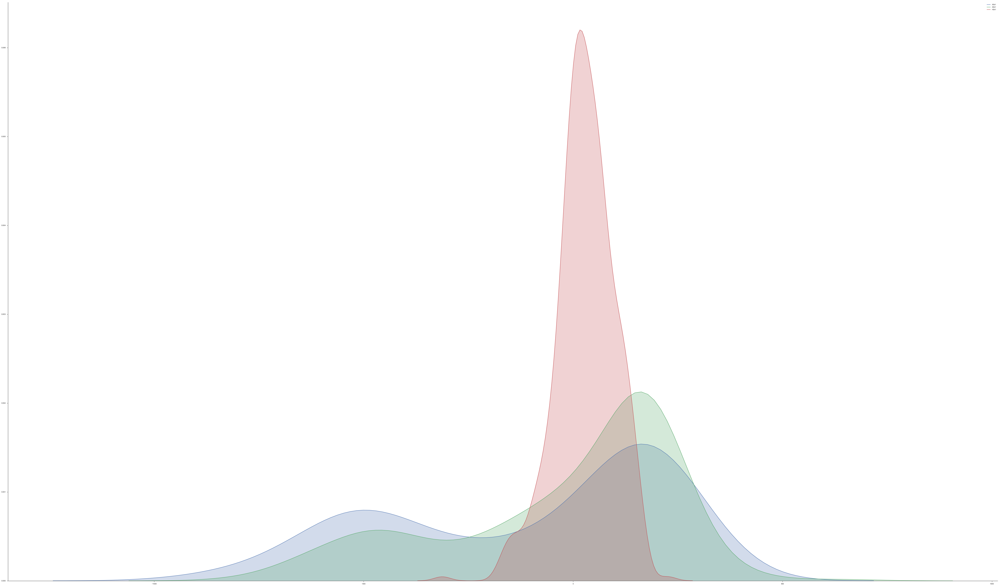

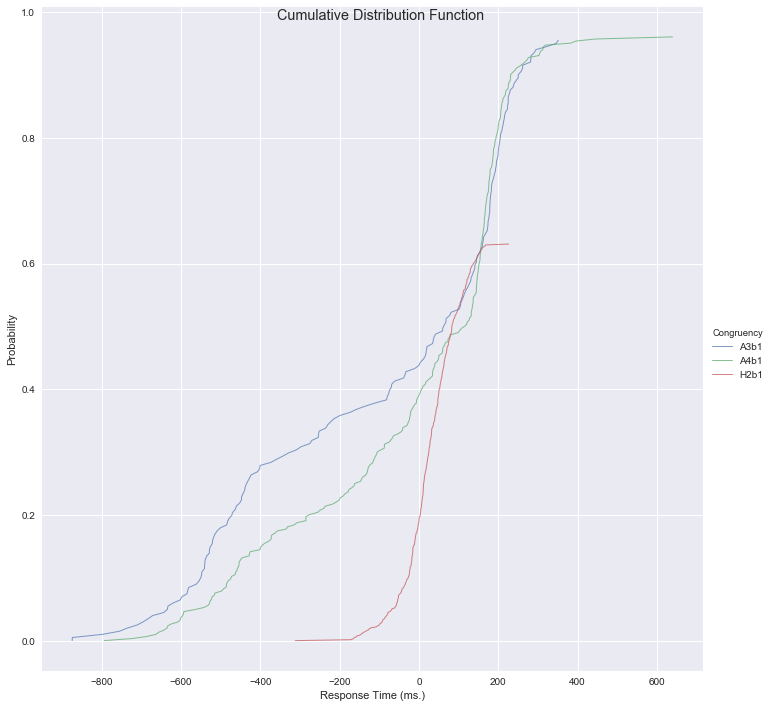

In [79]:
kde_plot(df, ['A3b1', 'A4b1','H2b1'], 'Sanitized Asynchrony', 'Test', save_file=False);
cdf_dat = cdf(df, conditions=['A3b1', 'A4b1','H2b1'])
cdf_plot(cdf_dat, legend=True, save_file=False)
d_data = calc_delta_data(df, "User ID", "Sanitized Asynchrony", "Test", ['A3b1', 'A4b1','H2b1'])
delta_plot(d_data)

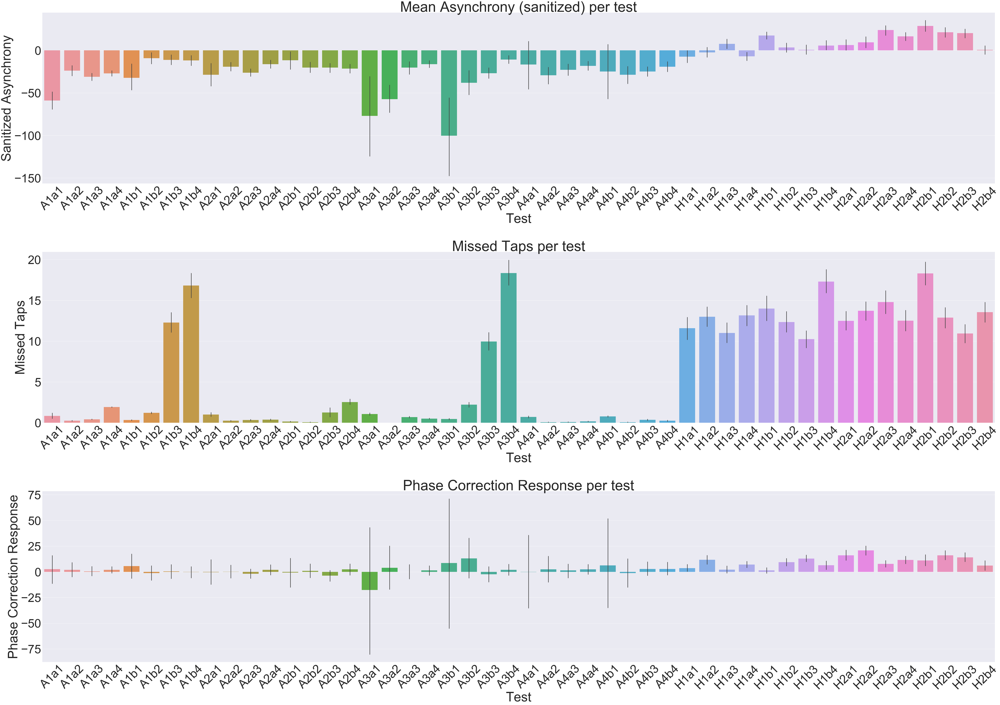

In [43]:
fig, axs = plt.subplots(nrows=3);
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.setp(axs[0].xaxis.get_majorticklabels(), rotation=45)
plt.setp(axs[1].xaxis.get_majorticklabels(), rotation=45)
plt.setp(axs[2].xaxis.get_majorticklabels(), rotation=45)
sns.barplot(x="Test",y="Sanitized Asynchrony",data=df,dodge=True,ax=axs[0],order=testList).set_title("Mean Asynchrony (sanitized) per test");
sns.barplot(x="Test",y="Missed Taps",data=df,dodge=True,ax=axs[1],order=testList).set_title("Missed Taps per test");
sns.barplot(x="Test",y="Phase Correction Response",data=df,dodge=True,ax=axs[2],order=testList).set_title("Phase Correction Response per test");
plt.savefig('AllSummary.png');

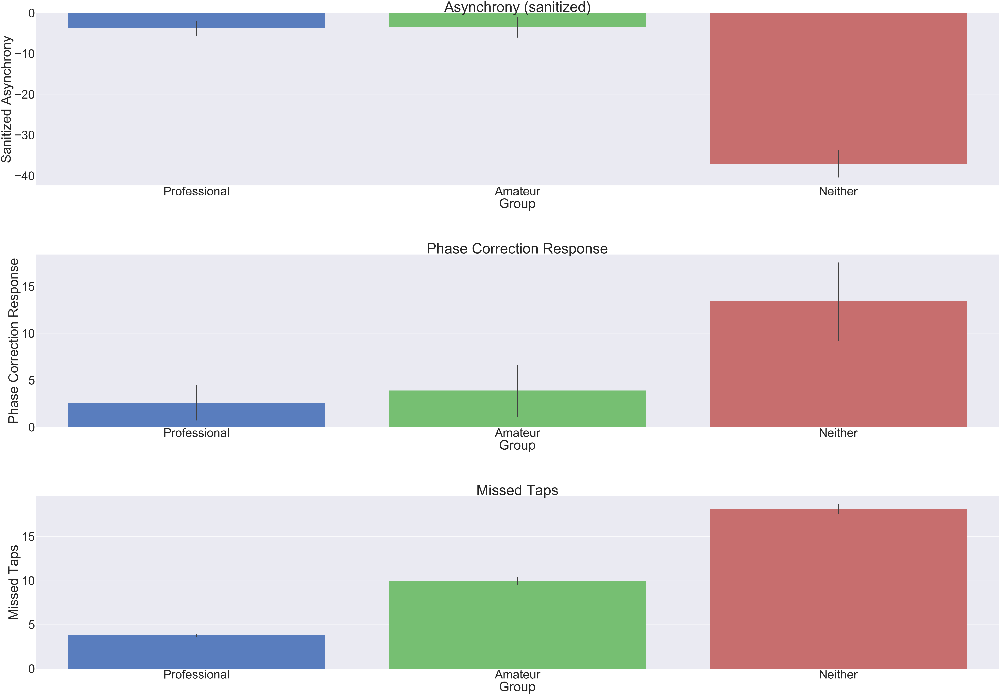

In [123]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(nrows=3);
    plt.subplots_adjust(hspace=0.4, wspace=0.4)
    sns.barplot(x="Group",y="Sanitized Asynchrony",data=df,dodge=True,ax=axs[0],order = ['Professional', 'Amateur', 'Neither']).set_title("Asynchrony (sanitized)"); 
    sns.barplot(x="Group",y="Phase Correction Response",data=df,dodge=True,ax=axs[1],order = ['Professional', 'Amateur', 'Neither']).set_title("Phase Correction Response"); 
    sns.barplot(x="Group",y="Missed Taps",data=df,dodge=True,ax=axs[2],order = ['Professional', 'Amateur', 'Neither']).set_title("Missed Taps"); 
    plt.savefig('GroupSummaries.png');

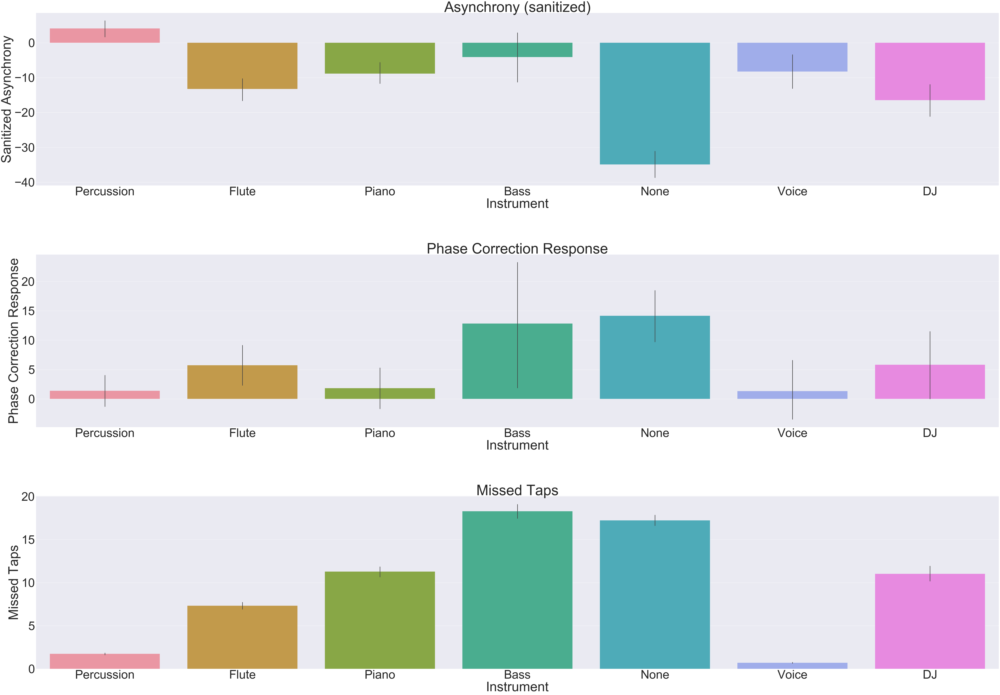

In [45]:
fig, axs = plt.subplots(nrows=3); 
# plt.subplots_adjust(top=.9);
# fig.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.4)
sns.barplot(x="Instrument",y="Sanitized Asynchrony",data=df,dodge=True,ax=axs[0]).set_title("Asynchrony (sanitized)"); 
sns.barplot(x="Instrument",y="Phase Correction Response",data=df,dodge=True,ax=axs[1]).set_title("Phase Correction Response");
sns.barplot(x="Instrument",y="Missed Taps",data=df,dodge=True,ax=axs[2]).set_title("Missed Taps");
plt.savefig('InstrumentSummaries.png');

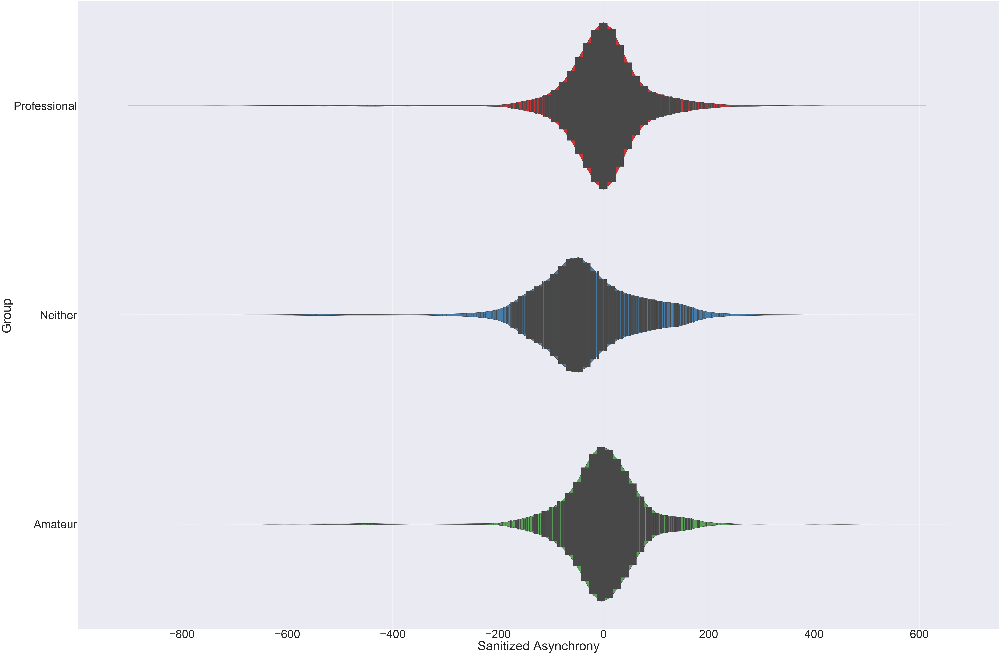

In [124]:
sns.violinplot(df["Sanitized Asynchrony"],df.Group,split=True, inner="stick", palette="Set3")
sns.violinplot(df["Sanitized Asynchrony"],df.Group,split=True, inner="stick", palette="Set1")

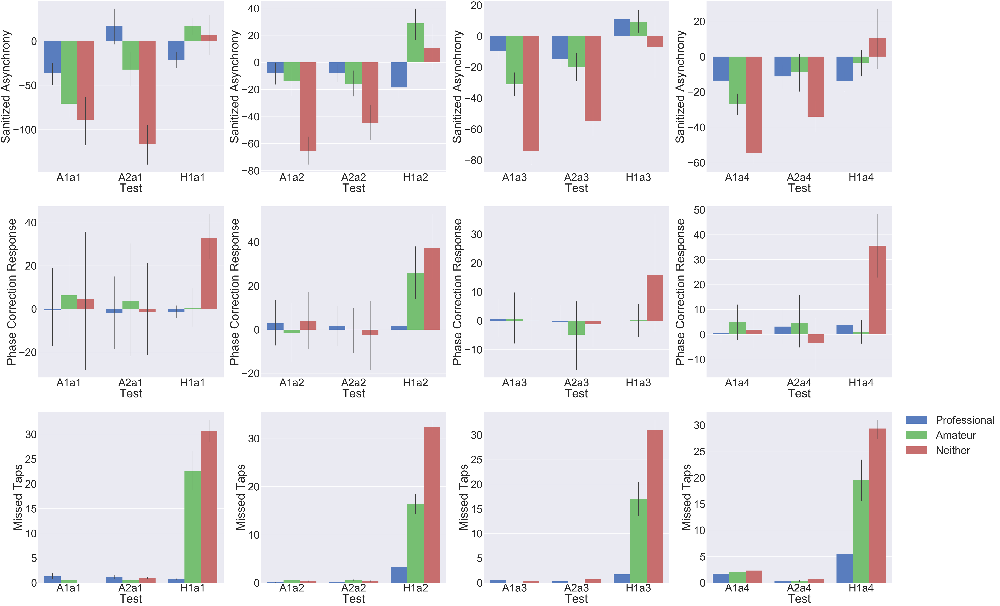

In [117]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A1a1','A2a1','H1a1']
    testList2 = ['A1a2','A2a2','H1a2']
    testList3 = ['A1a3','A2a3','H1a3']
    testList4= ['A1a4','A2a4','H1a4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    b = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    c = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    d = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid1.png');

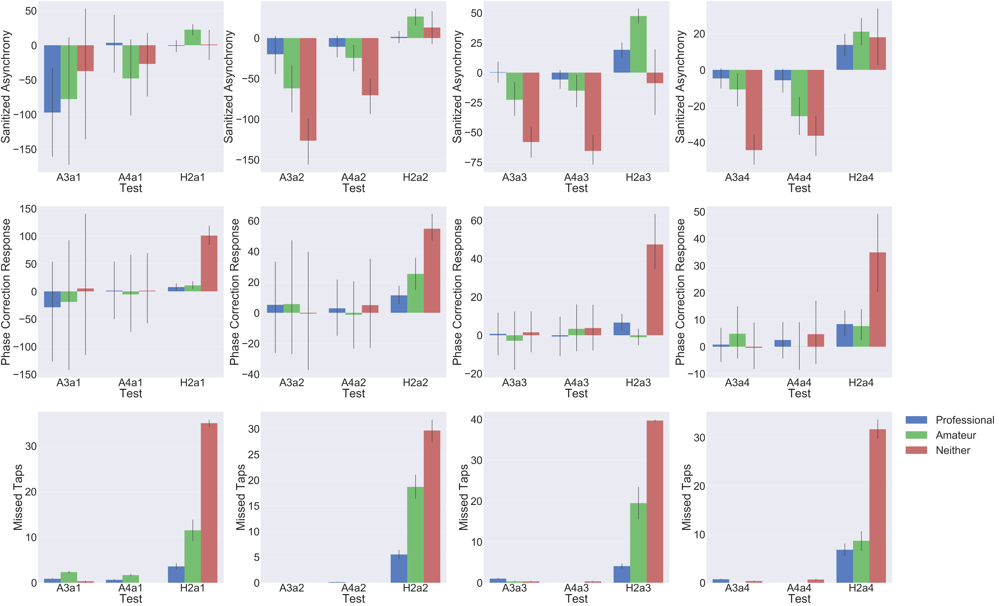

In [118]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A3a1','A4a1','H2a1']
    testList2 = ['A3a2','A4a2','H2a2']
    testList3 = ['A3a3','A4a3','H2a3']
    testList4= ['A3a4','A4a4','H2a4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    b = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    c = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    d = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid2.png');

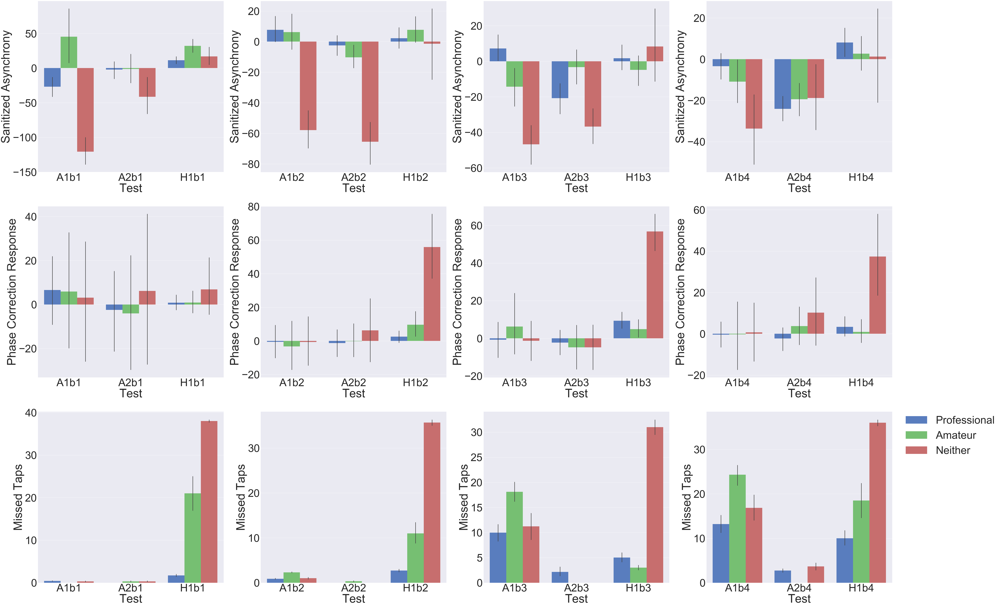

In [119]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A1b1','A2b1','H1b1']
    testList2 = ['A1b2','A2b2','H1b2']
    testList3 = ['A1b3','A2b3','H1b3']
    testList4= ['A1b4','A2b4','H1b4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    b = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    c = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    d = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid3.png');

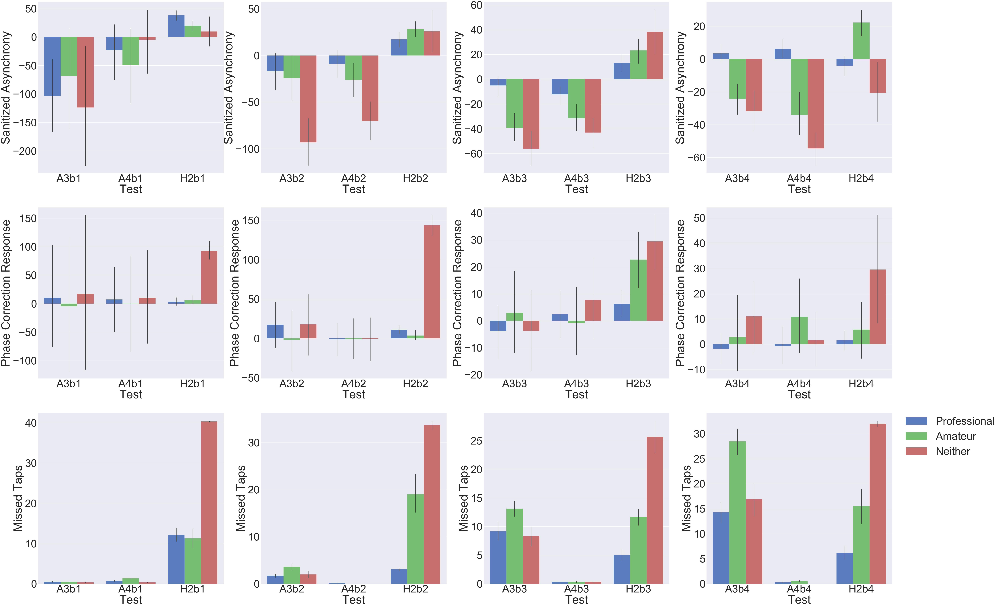

In [120]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A3b1','A4b1','H2b1']
    testList2 = ['A3b2','A4b2','H2b2']
    testList3 = ['A3b3','A4b3','H2b3']
    testList4= ['A3b4','A4b4','H2b4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    b = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    c = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    d = sns.barplot(y="Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'])
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'])
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'])
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'])
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid4.png');

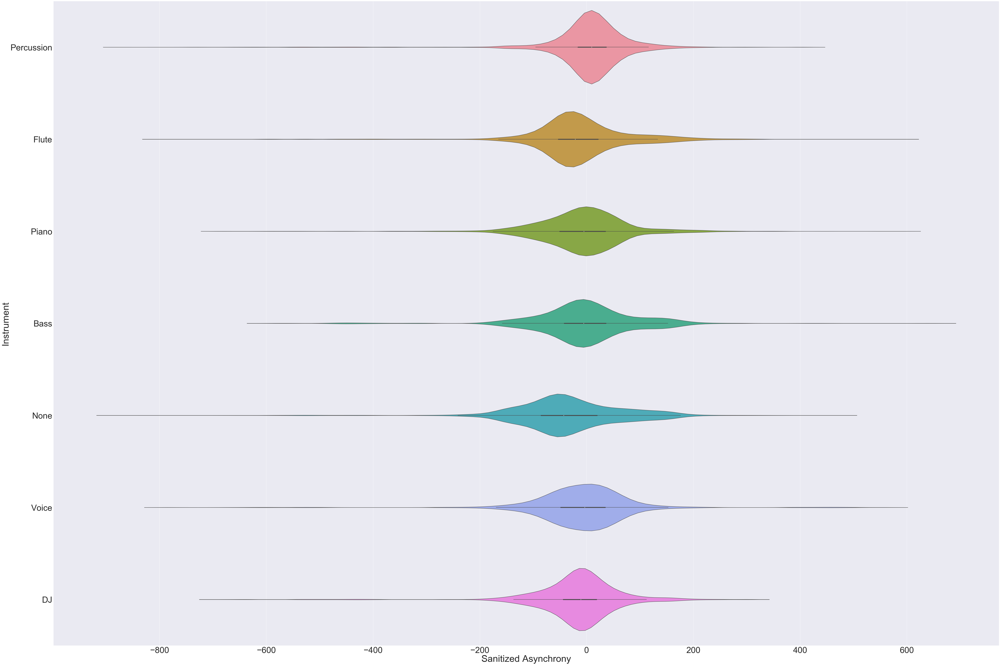

In [33]:
sns.violinplot(df["Sanitized Asynchrony"],df.Instrument)

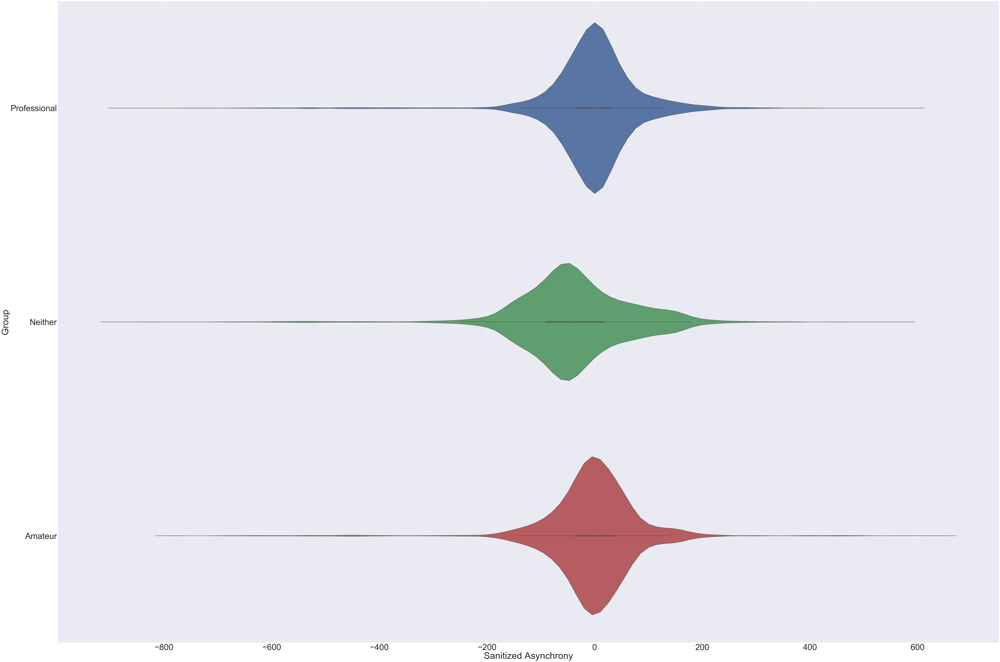

In [34]:
sns.violinplot(df["Sanitized Asynchrony"],df.Group)

In [34]:
def paired_ttest(x, y):
    """
    Function that will calculate the t-ratio
    :param x: list of scores in first condition
    :param y: list of scores in second condition
    :return statistics: a dictionary containing the t-value, p-value,
    and degrees of freedom
    """
    # Difference scores are going to be stored in a list
    di = []
    # Sample size = the length of variable x
    n = len(x)
    df = n-1

    # For each subject append the difference score between x & y
    # i is the index so we do the substraction for each subjects score on x and y
    for i in range(n):
        di.append(x[i] - y[i])

    # Avarage of the difference score. Note, division of integers in Python will result in an integer. Thus, we need
    # to convert one of the numbers to float datatype (using float())
    dbar = float(sum(di))/n

    # Calculation of standard deviation for the difference score
    std_di = 0

    # Each subjects difference score is subtracted by the avarage and exponated (i.e., "**2)
    for d in di:
        std_di += (d-dbar)**2

    # We get the standard deviation by dividing what was calculated above (std_di) by sample size (n). This value is
    # squared.
    std_di = np.sqrt(std_di/n)

    # Standard error of the mean is simple: standard deviation divided by the sample size -1 squared.
    se_dbar = std_di/np.sqrt(n-1)

    # T-ratio is calculated by dividing the avarage by the standard error of the mean
    t_val = dbar/se_dbar

    # P-value
    pval = t.sf(np.abs(t_val), df) * 2.

    # Last, we create the dictionary containing the needed statistics
    statistics = {'T-value': t_val, 'Degree of Freedom': df, 'P-value': pval}

    # Function returns a dictionary:
    return statistics

/usr/local/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



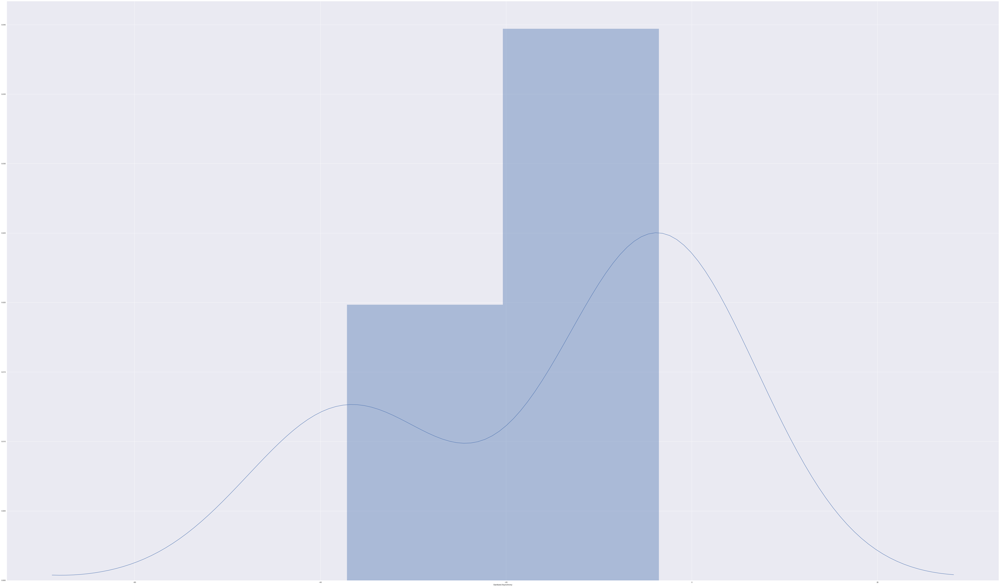

In [113]:
#Performance per Test
group_df = df.groupby(['Group'])
test = group_df['Sanitized Asynchrony'].mean()
sns.distplot(test);

In [20]:
#Performance per User
grouped_df = df.groupby(['Group','Instrument','User ID','Test']);
# grouped_df = df.groupby(['Instrument']);
# x = grouped_df['Sanitized Asynchrony'].mean()
# sns.distplot(x)
grouped_df['Sanitized Asynchrony'].describe().to_csv('/Users/nickpourazima/GitHub/he-sm/python/Analysis/test.csv')

In [374]:
grouped_sub = df.groupby(['Test', 'User ID'])
means = grouped_sub['Sanitized Asynchrony'].mean()
x, y = means['A1a1'].values,means['A1a2'].values
t_value = paired_ttest(x,y)
for key, value in t_value.items():
    t_value[key] = round(value, 3)
print(t_value)

{'T-value': -3.026, 'Degree of Freedom': 15, 'P-value': 0.009}


In [341]:
stats.ttest_rel(a=x,b=y)

Ttest_relResult(statistic=-2.8284554562438426, pvalue=0.10557101718037978)

In [92]:
stats.t.ppf(q=0.025,df=9)

-2.262157162740992

In [93]:
stats.t.ppf(q=0.975,df=9)

2.2621571627409915

In [94]:
stats.t.cdf(x=-0.53,df=9)*2

0.6089366906430735

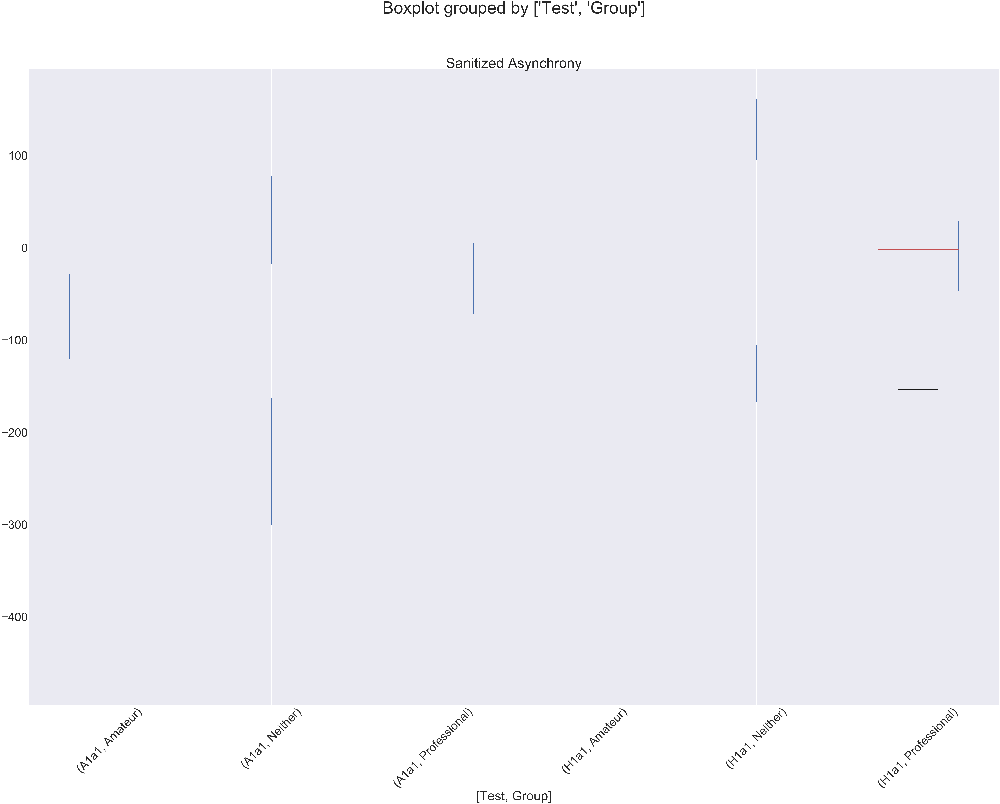

In [368]:
fig,ax = plt.subplots()
compare_1 = df.loc[df['Test'].isin(['A1a1','H1a1'])];
compare_1.boxplot(column=['Sanitized Asynchrony'],by=['Test','Group'],ax=ax);
plt.xticks(rotation=45);
# compare_1.iplot(kind='box',filename='cufflinks/box-plots')

In [387]:
data = df.loc[df['Test'].isin(['A1a1','A1a2'])];
 
#Create a boxplot
# data.boxplot('Sanitized Asynchrony', by='Group')
 
# ctrl = data['Sanitized Asynchrony'][data.Group == 'Professional']
 
# grps = pd.unique(data.Group.values)
# d_data = {grp:data['Sanitized Asynchrony'][data.Group == grp] for grp in grps}
 
# k = len(pd.unique(data.Group))  # number of conditions
# N = len(data.values)  # conditions times participants
# n = data.groupby('Group').size()[0] #Participants in each condition
# DFbetween = k - 1
# DFwithin = N - k
# DFtotal = N - 1
# SSbetween = (sum(data.groupby('Group').sum()['Sanitized Asynchrony']**2)/n) - (data['Sanitized Asynchrony'].sum()**2)/N
# sum_y_squared = sum([value**2 for value in data['Sanitized Asynchrony'].values])
# SSwithin = sum_y_squared - sum(data.groupby('Group').sum()['Sanitized Asynchrony']**2)/n
# SStotal = sum_y_squared - (data['Sanitized Asynchrony'].sum()**2)/N
# MSbetween = SSbetween/DFbetween
# MSwithin = SSwithin/DFwithin
# F = MSbetween/MSwithin
# p = stats.f.sf(F, DFbetween, DFwithin)
# eta_sqrdet  = SSbetween/SStotal
# om_sqrd = (SSbetween - (DFbetween * MSwithin))/(SStotal + MSwithin)

weight = data['Sanitized Asynchrony']
group = data['User ID']

mod = ols('weight ~ group',
                data=data).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)


                sum_sq     df         F    PR(>F)
group     1.054420e+02    1.0  0.021987  0.882169
Residual  3.064428e+06  639.0       NaN       NaN


In [388]:
data1 = df.loc[df['Test'].isin(['A1a1'])]['Sanitized Asynchrony'].dropna().tolist()
data2 = df.loc[df['Test'].isin(['A1a2'])]['Sanitized Asynchrony'].dropna().tolist()
twosample_results = stats.ttest_ind(data1, data2)
matrix_twosample = [
    ['', 'Test Statistic', 'p-value'],
    ['Data', twosample_results[0], twosample_results[1]]
]
twosample_table = FF.create_table(matrix_twosample, index=True)

# Group data together
hist_data = [data1, data2]#, x3, x4]

group_labels = ['A1a1', 'A1a2']#, 'Group 3', 'Group 4']

# Create distplot with custom bin_size

fig = FF.create_distplot(hist_data, group_labels,colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)'])

# Plot!
# offline.plot(fig, filename='Distplot with Multiple Datasets',image='jpeg')
py.iplot(twosample_table, filename='twosample-table')

/usr/local/lib/python3.6/site-packages/plotly/tools.py:1491: UserWarning:

plotly.tools.FigureFactory.create_table is deprecated. Use plotly.figure_factory.create_table

/usr/local/lib/python3.6/site-packages/plotly/tools.py:1491: UserWarning:

plotly.tools.FigureFactory.create_distplot is deprecated. Use plotly.figure_factory.create_distplot



In [417]:
from scipy.stats import ttest_ind

test1 = df[df['Test']=='A3a4'][df['Group']=='Professional']
test2 = df[df['Test']=='H2a4'][df['Group']=='Professional']

ttest_ind(test1['Sanitized Asynchrony'].dropna(), test2['Sanitized Asynchrony'].dropna())

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Ttest_indResult(statistic=-4.199920469226675, pvalue=3.12141875338871e-05)